Notes:
- Jalankan satu persatu
- Jalankan sesuai dengan kebutuhan model

---
Berikut list model dalam python notebook ini:
1.   Neural Prophet
2.   Facebook Prophet




# 0. Setup

## 0.1 Install Neural Prophet

In [96]:
# !git clone https://github.com/ourownstory/neural_prophet.git

%cd neural_prophet

# !pip install .

[Errno 2] No such file or directory: 'neural_prophet'
/Users/efraimwijaya/Developer/github/skripsi-forecasting-neural-prophet/new-neural-prophet/neural_prophet


In [97]:
# !pip install livelossplot

In [98]:
!git checkout tags/0.3.1

HEAD is now at badb2d7 Auto epochs: wider range of auto-epochs: 10-1000 (#570)


## 0.2 Install Facebook Prophet

In [99]:
!pip install pystan==2.19.1.1
!pip install cmdstanpy==0.9.5
!pip install prophet

  Using cached cmdstanpy-0.9.5-py3-none-any.whl (37 kB)
  Attempting uninstall: cmdstanpy
    Found existing installation: cmdstanpy 1.0.1
    Uninstalling cmdstanpy-1.0.1:
      Successfully uninstalled cmdstanpy-1.0.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
prophet 1.1 requires cmdstanpy>=1.0.1, but you have cmdstanpy 0.9.5 which is incompatible.
  Using cached cmdstanpy-1.0.1-py3-none-any.whl (69 kB)
  Attempting uninstall: cmdstanpy
    Found existing installation: cmdstanpy 0.9.5
    Uninstalling cmdstanpy-0.9.5:
      Successfully uninstalled cmdstanpy-0.9.5


## 0.3 Import Module

In [172]:
# neural prophet module
from neuralprophet import NeuralProphet

# facebook prophet module
from prophet import Prophet
import torch

# data manipulation
import numpy as np
import pandas as pd

# plotting / visualization
from matplotlib import pyplot as plt
import seaborn as sns

# classical machine learning models / basic calculation
from sklearn.metrics import mean_absolute_error, mean_squared_error
import math

In [163]:
# in case random of gradient descent we use seed
from neuralprophet import set_random_seed
set_random_seed(0)

# 1. Data Preprocessing

In [102]:
!pwd
!ls

/Users/efraimwijaya/Developer/github/skripsi-forecasting-neural-prophet/new-neural-prophet/neural_prophet
CODE_OF_CONDUCT.md              model
CONTRIBUTING.md                 neuralprophet
COVID_19_Neural_Prophet_8.ipynb neuralprophet.egg-info
LICENSE                         notes
MANIFEST.in                     pyproject.toml
README.md                       requirements.txt
build                           scripts
codecov.yml                     setup.py
datasets                        tests
docs                            tutorials
mkdocs.yml


## 1.1 Read Datasets

In [3]:
# data location
data_location = "./datasets/statistik-harian-2022.xlsx"
# data_location = "./datasets/with23jul.xlsx"

# read data 
df = pd.read_excel(
    data_location,
    usecols=['Tanggal','Kasus harian'],
    dtype={
        'Kasus harian': 'int',
    },
    converters= {
        'Tanggal': pd.to_datetime
    }
)

# rename to ds, y 
df = pd.DataFrame(list(zip(df["Tanggal"], df["Kasus harian"])),
               columns =['ds', 'y'])

In [104]:
df.tail()

,ds,y
771,2022-04-13,1551
772,2022-04-14,833
773,2022-04-15,922
774,2022-04-16,602
775,2022-04-17,607


# 2. Model

## 2.1 Add Event to Model

In [4]:
# For Neural Prophet
covidVariantNeuralProphet = pd.DataFrame({ # COVID-19 variant
    'event': 'covidVariantNeuralProphet',
    'ds': pd.to_datetime([
        '2021-05-01', # Alpha, Beta, Delta
        '2021-12-01', # Omnicorn
        '2022-03-15', # Son of omnicorn
    ]),
    'lower_window': 0, # Before Event
    'upper_window': 30*3, # After Event
})

hariRayaNeuralProphet = pd.DataFrame({ # manual set hari raya as holidays
    'event': 'hariRayaNeuralProphet',
    'ds': pd.to_datetime([
        # 2020
        '2020-01-01', '2020-01-25', '2020-03-22',
        '2020-03-25', '2020-04-10', '2020-05-01',
        '2020-05-07', '2020-05-21', '2020-05-22',
        '2020-05-24', '2020-05-25', '2020-06-01',
        '2020-07-31', '2020-08-17', '2020-08-21',
        '2020-10-28', '2020-10-29', '2020-10-30',
        '2020-12-09', '2020-12-24', '2020-12-25',
        '2020-12-31',
        # 2021
        '2021-01-01', '2021-02-12', '2021-03-11',
        '2021-03-14', '2021-04-02', '2021-05-01',
        '2021-05-12', '2021-05-13', '2021-05-14',
        '2021-05-26', '2021-06-01', '2021-07-20', 
        '2021-08-11', '2021-08-17', '2021-10-20', 
        '2021-12-25', '2021-12-31',
        # 2022
        '2022-01-01', '2022-02-01', '2022-02-28',
        '2022-03-03', '2022-04-15', '2022-05-01',
        '2022-05-02', '2022-05-03', '2022-05-16',
        '2022-05-26', '2022-06-01', '2022-07-09', 
        '2022-07-30', '2022-08-17', '2022-10-08', 
        '2022-12-25', '2022-12-31',
        # 2023
        '2023-01-01', '2023-01-22', '2023-02-18',
        '2023-03-22', '2023-04-07', '2023-04-22',
        '2023-04-23', '2023-05-01', '2023-05-06',
        '2023-05-18', '2023-06-01', '2023-06-29',
        '2023-07-19', '2023-08-17', '2023-09-27',
        '2023-12-25',     

    ]),
    'lower_window': 0, # Before Event
    'upper_window': 1, # After Event
})

# merge data as one history event
df_event_neural_prophet = pd.concat((covidVariantNeuralProphet, hariRayaNeuralProphet))

# For Facebook Prophet
covidVariantFacebookProphet = pd.DataFrame({ # COVID-19 variant
    'holiday': 'covidVariantFacebookProphet',
    'ds': pd.to_datetime([
        '2021-05-01', # Alpha, Beta, Delta
        '2021-12-01', # Omnicorn
        '2022-03-15', # Son of omnicorn
    ]),
    'lower_window': 0,
    'upper_window': 30*3,
})

hariRayaFacebookProphet = pd.DataFrame({ # manual set hari raya as holidays
    'holiday': 'hariRayaFacebookProphet',
    'ds': pd.to_datetime([
        # 2020
        '2020-01-01', '2020-01-25', '2020-03-22',
        '2020-03-25', '2020-04-10', '2020-05-01',
        '2020-05-07', '2020-05-21', '2020-05-22',
        '2020-05-24', '2020-05-25', '2020-06-01',
        '2020-07-31', '2020-08-17', '2020-08-21',
        '2020-10-28', '2020-10-29', '2020-10-30',
        '2020-12-09', '2020-12-24', '2020-12-25',
        '2020-12-31',
        # 2021
        '2021-01-01', '2021-02-12', '2021-03-11',
        '2021-03-14', '2021-04-02', '2021-05-01',
        '2021-05-12', '2021-05-13', '2021-05-14',
        '2021-05-26', '2021-06-01', '2021-07-20', 
        '2021-08-11', '2021-08-17', '2021-10-20', 
        '2021-12-25', '2021-12-31',
        # 2022
        '2022-01-01', '2022-02-01', '2022-02-28',
        '2022-03-03', '2022-04-15', '2022-05-01',
        '2022-05-02', '2022-05-03', '2022-05-16',
        '2022-05-26', '2022-06-01', '2022-07-09', 
        '2022-07-30', '2022-08-17', '2022-10-08', 
        '2022-12-25', '2022-12-31',
        # 2023
        '2023-01-01', '2023-01-22', '2023-02-18',
        '2023-03-22', '2023-04-07', '2023-04-22',
        '2023-04-23', '2023-05-01', '2023-05-06',
        '2023-05-18', '2023-06-01', '2023-06-29',
        '2023-07-19', '2023-08-17', '2023-09-27',
        '2023-12-25',     

    ]),
    'lower_window': 0,
    'upper_window': 1,
})

df_event_facebook_prophet = pd.concat((covidVariantFacebookProphet, hariRayaFacebookProphet))

## 2.2 Set Model Parameter

In [5]:
metrics = ['SmoothL1Loss', 'MAE', 'RMSE']

params_facebook_prophet = {
    # trend
    'n_changepoints' : 30, 

    # seasonality
    'yearly_seasonality' : True,
    'weekly_seasonality' : True,
    'daily_seasonality' : False,
    'seasonality_mode' : 'multiplicative', 
    
    # event
    'holidays' : df_event_facebook_prophet,

}

params_neural_prophet_nn = {
    # Data Preprocessing
    # 'normalize' : 'minmax',
    'impute_missing' : True,
    
    # Trend
    # 'growth' : 'off', 
    'n_changepoints' : 30,
    # 'changepoints_range' : 0.4, 
    # 'trend_reg' : 0,

    # Seasonality
    'yearly_seasonality' : True, 
    'weekly_seasonality' : True, 
    'daily_seasonality' : False, 
    'seasonality_mode' : 'multiplicative', 
    # 'seasonality_reg' : 0, # regularize seasonal

    # AR-Net (Classical AR)
    'n_lags' : 60,
    'n_forecasts' : 30,
    # 'ar_reg' : 0.7, # regularize ar

    # Neural Network + (Classical AR)
    'batch_size' : 30, 
    'epochs' : 500,
    'num_hidden_layers' : 4,
    'd_hidden' : 16, 
    'learning_rate' : 0.005, 
    'loss_func' : 'mae',
    # 'collect_metrics' : True,
}

## 2.3 Neural Prophet Model

### 2.3.1 Model

In [6]:
# set model with params
m = NeuralProphet(
    **params_neural_prophet_nn
)

# add history event
m = m.add_events(["covidVariantNeuralProphet", "hariRayaNeuralProphet"])
concat_df_event_neural_prophet = m.create_df_with_events(df, df_event_neural_prophet)

In [200]:
# # split size data concat_df_event_neural_prophet
# df_size = concat_df_event_neural_prophet['y'].size
# df_train_size = int(df_size*0.8)
# df_test_size = int(df_size*0.2)

# # set size of train datasets
# df_train_neural_prophet = concat_df_event_neural_prophet[:df_train_size]

# # as train datasets make it to string date
# date = df_train_neural_prophet['ds'].tail(1)
# date = date.to_string(index=False)
# # date

# # split data as data time
# df_train_neural_prophet = concat_df_event_neural_prophet[df['ds'] < pd.Timestamp(date)]
# df_test_neural_prophet = concat_df_event_neural_prophet[df['ds'] >= pd.Timestamp(date)]

# df_train_neural_prophet.tail()

,ds,y,covidVariantNeuralProphet,hariRayaNeuralProphet
614,2021-11-07,444,0.0,0.0
615,2021-11-08,244,0.0,0.0
616,2021-11-09,434,0.0,0.0
617,2021-11-10,480,0.0,0.0
618,2021-11-11,435,0.0,0.0


In [203]:
# split size data concat_df_event_neural_prophet

df_size = concat_df_event_neural_prophet['y'].size - 30
df_train_size = int(df_size*0.8) #597 19/10/2021
df_test_size = int(df_size*0.2) #149 17/03/2022

# set size of train datasets
df_train_neural_prophet = concat_df_event_neural_prophet[:df_train_size]
df_test_neural_prophet = concat_df_event_neural_prophet[df_train_size:-31]

df_val_neural_prophet = concat_df_event_neural_prophet[-31:]

# print(df_train_neural_prophet)
# print(df_test_neural_prophet)
# print(df_val_neural_prophet)

In [ ]:
# # # train data
# metrics_neural_prophet = m.fit(
#     df=df_train_neural_prophet, 
#     freq='D', 
#     validation_df=df_test_neural_prophet, 
#     progress='plot',
# )

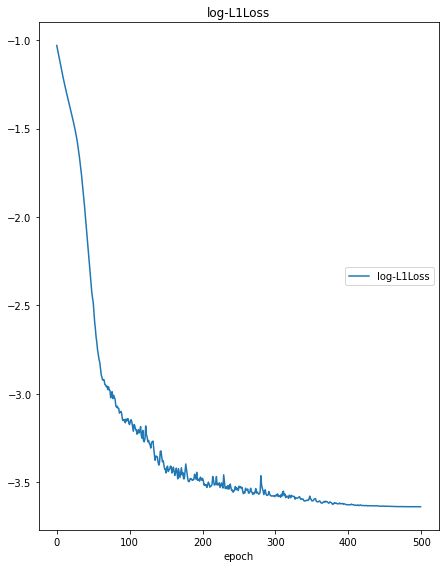

log-L1Loss
	log-L1Loss       	 (min:   -3.638, max:   -1.030, cur:   -3.638)


In [8]:
# # train all data
metrics_neural_prophet = m.fit(
    df=concat_df_event_neural_prophet, 
    freq='D', 
    # validation_df=df_test_neural_prophet, 
    progress='plot',
)

In [ ]:
plt.plot(metrics_neural_prophet)
plt.show()

In [9]:
metrics_neural_prophet

,L1Loss,MAE,RMSE,RegLoss
0,0.356972,13300.420132,17365.933097,0.0
1,0.349519,13022.732053,17028.576200,0.0
2,0.342601,12764.979594,16701.873748,0.0
3,0.335615,12504.662478,16373.357516,0.0
4,0.328599,12243.267683,16132.261083,0.0
...,...,...,...,...
495,0.026311,980.329071,2313.070965,0.0
496,0.026311,980.328252,2310.253944,0.0
497,0.026311,980.322933,2328.013299,0.0
498,0.026311,980.320892,2336.682791,0.0


In [10]:
metrics_neural_prophet.describe().loc[["mean", "std", "min", "max"]]

,L1Loss,MAE,RMSE,RegLoss
mean,0.050606,1885.542726,3495.693587,0.0
std,0.061740,2300.364730,2905.581516,0.0
min,0.026311,980.319552,2251.352837,0.0
max,0.356972,13300.420132,17365.933097,0.0


## 2.4 Facebook Prophet Model

### 2.4.1 Model


In [255]:
# split size data
df_size = df['y'].size
df_train_size = int(df_size*0.8)
df_test_size = int(df_size*0.2)

In [256]:
# set size of train datasets
df_train_facebook_prophet = df[:df_train_size]
df_train_facebook_prophet.tail(1)

,ds,y
619,2021-11-12,399


In [257]:
# split size data
df_size = df['y'].size
df_train_size = int(df_size*0.8)
df_test_size = int(df_size*0.2)

# set size of train datasets
df_train_facebook_prophet = df[:df_train_size]
df_train_facebook_prophet.tail(1)

# as train datasets make it to string date
date = df_train_facebook_prophet['ds'].tail(1)
date = date.to_string(index=False)

# split data as data time
df_train_facebook_prophet = df[df['ds'] < pd.Timestamp(date)]
df_test_facebook_prophet = df[df['ds'] >= pd.Timestamp(date)]

In [258]:
# set model parameter
m = Prophet(
    **params_facebook_prophet
)

# fit model with data train
m.fit(df)

INFO:cmdstanpy:Chain [1] start processing
INFO:cmdstanpy:Chain [1] done processing


# 3. Plot Forecast

## 3.1 Neural Prophet

### 3.1.1 Plot

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.742% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
WARNING - (py.warnings._showwarnmsg) - /Users/efraimwijaya/Developer/github/skripsi-forecasting-neural-prophet/new-neural-prophet/neural_prophet/neuralprophet/forecaster.py:1665: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(future_df)

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.752% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.752% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.forecaster.__handle_missing_data) - 1 missing dates added.
INFO - (NP.forecaster.__handle_missin

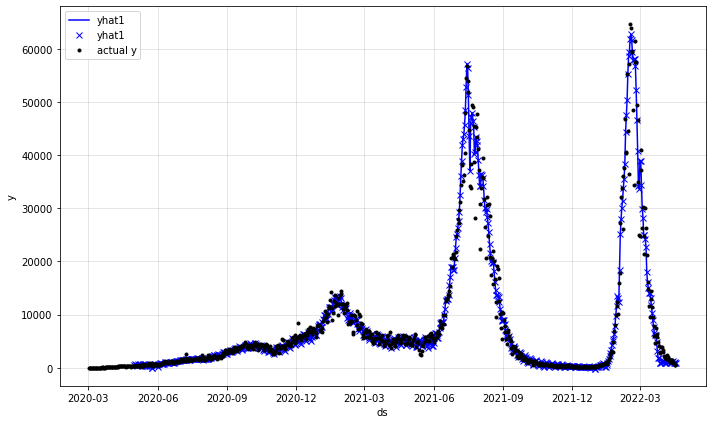

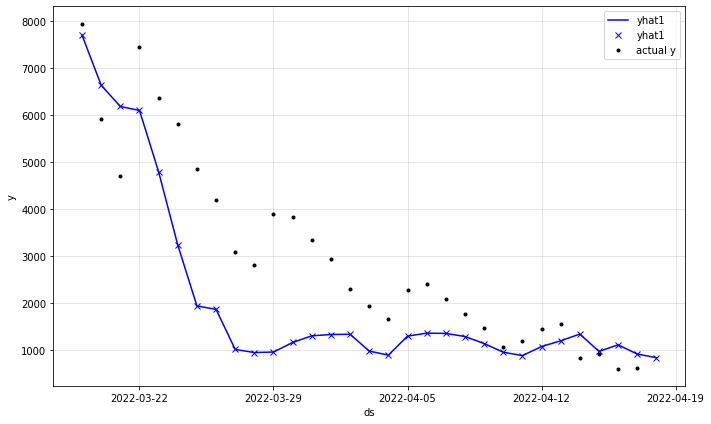

In [12]:
# forecast test data
future = m.make_future_dataframe(
    df=concat_df_event_neural_prophet, 
    events_df=df_event_neural_prophet, 
    n_historic_predictions=True,
)
forecast_in_sample = m.predict(future)

m = m.highlight_nth_step_ahead_of_each_forecast(1)

fig = m.plot(forecast_in_sample)
fig1 = m.plot(forecast_in_sample[-60:])


In [ ]:
m = m.highlight_nth_step_ahead_of_each_forecast(1)

fig = m.plot(forecast_in_sample)
fig1 = m.plot(forecast_in_sample[-60:])

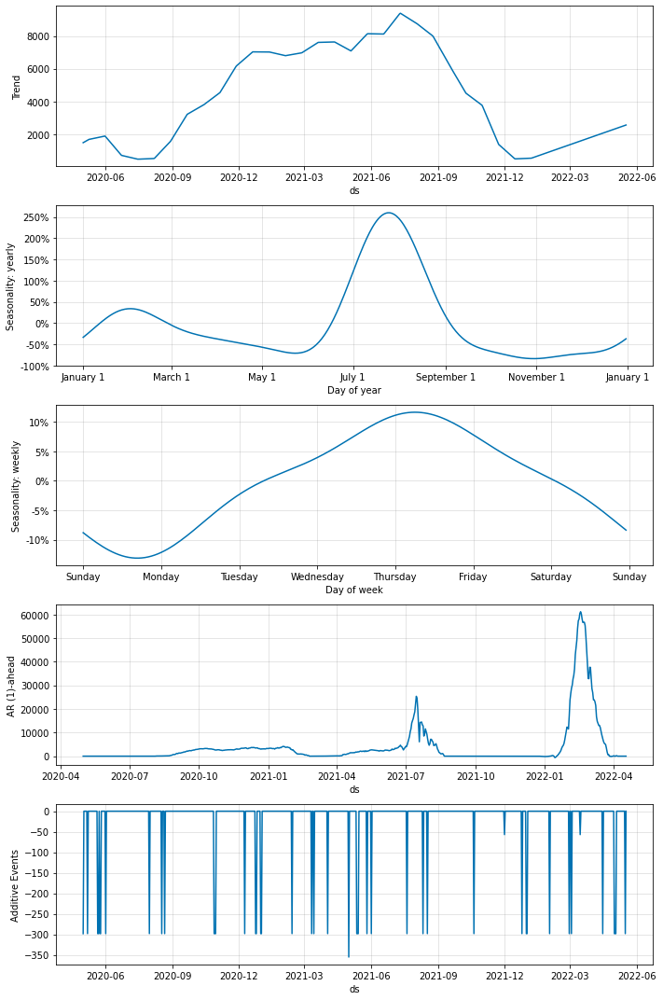

In [13]:
# plot component
fig = m.plot_components(forecast_in_sample)

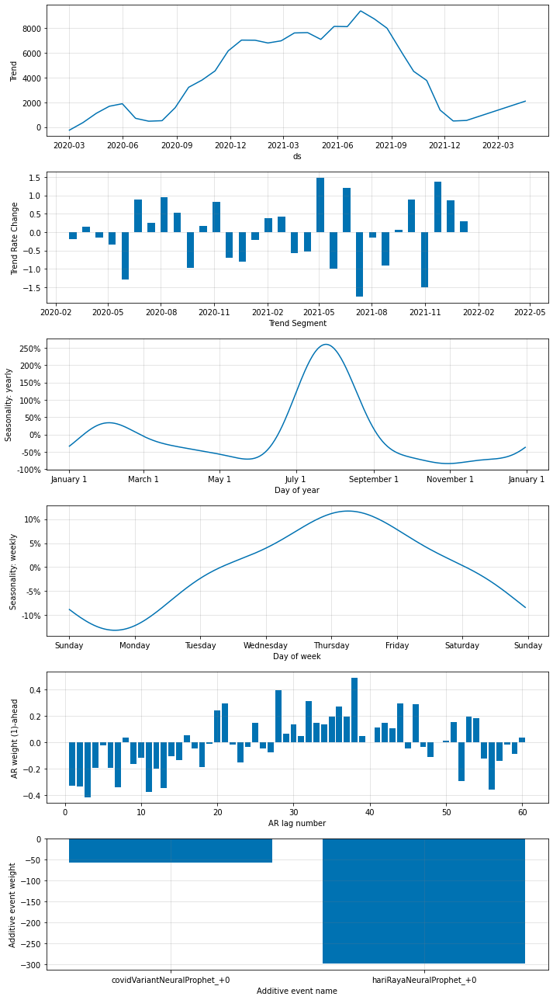

In [14]:
# plot all parameter
fig_param = m.plot_parameters()

In [ ]:
forecast_in_sample.columns.to_list()

In [16]:
print(concat_df_event_neural_prophet['y'])
print(forecast_in_sample['yhat1'][:-30])

0         2
1         0
2         0
3         0
4         2
       ... 
771    1551
772     833
773     922
774     602
775     607
Name: y, Length: 776, dtype: int64
0             None
1             None
2             None
3             None
4             None
          ...     
772    1193.509644
773     1336.92395
774     967.770142
775    1107.111084
776     910.856506
Name: yhat1, Length: 777, dtype: object


In [17]:
actuals = concat_df_event_neural_prophet['y']
predictions = forecast_in_sample['yhat1'][:-31].fillna(0)

In [18]:
print(actuals.to_markdown())
print(predictions.to_markdown())

|     |     y |
|----:|------:|
|   0 |     2 |
|   1 |     0 |
|   2 |     0 |
|   3 |     0 |
|   4 |     2 |
|   5 |     0 |
|   6 |     2 |
|   7 |    13 |
|   8 |     8 |
|   9 |     0 |
|  10 |    35 |
|  11 |    27 |
|  12 |    21 |
|  13 |    17 |
|  14 |    38 |
|  15 |    55 |
|  16 |    82 |
|  17 |    60 |
|  18 |    81 |
|  19 |    64 |
|  20 |    65 |
|  21 |   106 |
|  22 |   105 |
|  23 |   103 |
|  24 |   153 |
|  25 |   109 |
|  26 |   130 |
|  27 |   129 |
|  28 |   114 |
|  29 |   149 |
|  30 |   113 |
|  31 |   196 |
|  32 |   106 |
|  33 |   181 |
|  34 |   218 |
|  35 |   247 |
|  36 |   218 |
|  37 |   337 |
|  38 |   219 |
|  39 |   330 |
|  40 |   399 |
|  41 |   316 |
|  42 |   282 |
|  43 |   297 |
|  44 |   380 |
|  45 |   407 |
|  46 |   325 |
|  47 |   327 |
|  48 |   185 |
|  49 |   375 |
|  50 |   283 |
|  51 |   357 |
|  52 |   436 |
|  53 |   396 |
|  54 |   275 |
|  55 |   214 |
|  56 |   415 |
|  57 |   260 |
|  58 |   347 |
|  59 |   433 |
|  60 | 

In [20]:
import plotly.graph_objs as go

fig = go.Figure()
fig.add_trace(go.Scatter(x=concat_df_event_neural_prophet['ds'], y=concat_df_event_neural_prophet['y'], name='Actual',))
fig.add_trace(go.Scatter(x=forecast_in_sample['ds'], y=forecast_in_sample['yhat1'], name='Predicted',))
# fig.add_trace(go.Scatter(x=forecast_in_sample['ds'], y=forecast_in_sample['event_covidVariantNeuralProphet'], name='Covid Variant',))
# fig.add_trace(go.Scatter(x=forecast_in_sample['ds'], y=forecast_in_sample['event_hariRayaNeuralProphet'], name='Hari Raya',))

fig.show()

In [21]:
# Neural Prophet
from statsmodels.tools.eval_measures import rmse, meanabs, mse

print(f"RMSE: {(rmse(actuals, predictions))}")
print(f"MSE: {(mse(actuals, predictions))}")
print(f"MAE: {(meanabs(actuals, predictions))}")
print(f"MAPE: {(np.round(np.mean(np.abs(100*actuals/predictions)), 0))} %")

RMSE: 2168.0667202197787
MSE: 4700513.303324548
MAE: 992.9305142680395
MAPE: inf %


In [22]:
# using sklearn
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error

print(f"RMSE: {(mean_squared_error(actuals, predictions, squared=False))}")
print(f"MSE: {(mean_squared_error(actuals, predictions, squared=True))}")
print(f"MAE: {(mean_absolute_error(actuals, predictions))}")
print(f"MAPE: {(mean_absolute_percentage_error(actuals, predictions))} %")

RMSE: 2168.0667202197787
MSE: 4700513.303324548
MAE: 992.9305142680395
MAPE: 0.24547416017245263 %


## 3.2 Facebook Prophet

In [259]:
future = m.make_future_dataframe(
    periods=30,
    freq='D',
    include_history=True,

)

future.tail()

,ds
801,2022-05-13
802,2022-05-14
803,2022-05-15
804,2022-05-16
805,2022-05-17


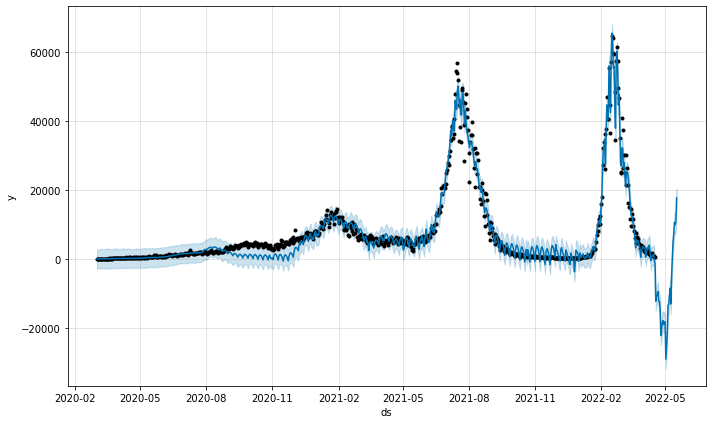

In [260]:
forecast_in_sample = m.predict(future)
fig = m.plot(forecast_in_sample)

In [261]:
forecast_in_sample.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,covidVariantFacebookProphet,covidVariantFacebookProphet_lower,covidVariantFacebookProphet_upper,hariRayaFacebookProphet,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat
801,2022-05-13,37874.374821,4482.082263,9983.201250,37732.358952,38045.773412,-0.906347,-0.906347,-0.906347,0.000000,...,0.053358,0.053358,0.053358,0.040908,0.040908,0.040908,0.0,0.0,0.0,7117.308662
802,2022-05-14,37968.979819,7849.110260,13451.755617,37814.440308,38147.680758,-0.801377,-0.801377,-0.801377,0.000000,...,0.014070,0.014070,0.014070,0.065655,0.065655,0.065655,0.0,0.0,0.0,10568.597899
803,2022-05-15,38063.584818,7018.201182,12695.339838,37899.468566,38256.938828,-0.761693,-0.761693,-0.761693,0.000000,...,-0.066492,-0.066492,-0.066492,0.087497,0.087497,0.087497,0.0,0.0,0.0,9870.342717
804,2022-05-16,38158.189817,8036.992895,13784.394819,37978.668151,38369.326925,-0.674348,-0.674348,-0.674348,-0.005632,...,-0.142571,-0.142571,-0.142571,0.106362,0.106362,0.106362,0.0,0.0,0.0,10829.758028
805,2022-05-17,38252.794815,14767.143393,20347.960122,38062.682414,38481.803583,-0.531616,-0.531616,-0.531616,-0.125219,...,-0.003984,-0.003984,-0.003984,0.122283,0.122283,0.122283,0.0,0.0,0.0,17652.288207


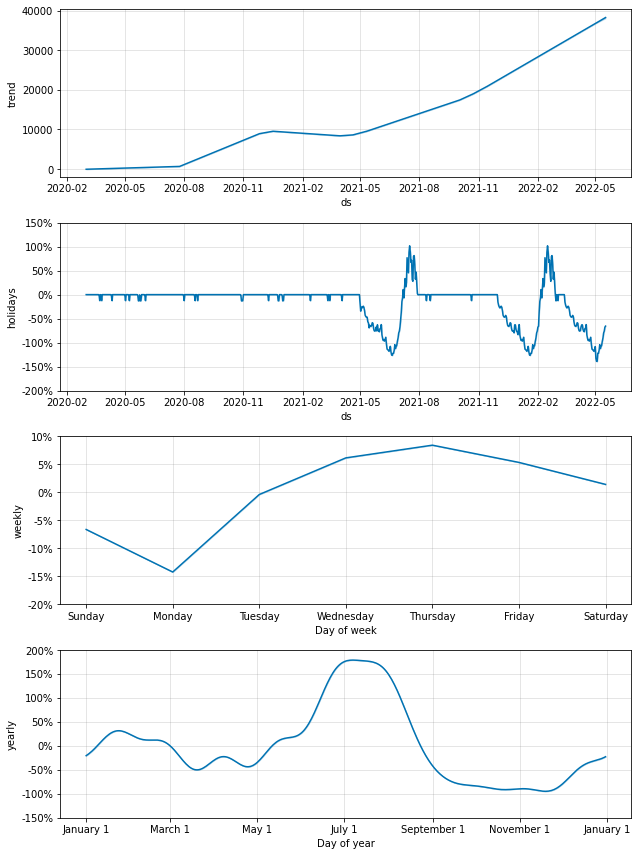

In [262]:
# plot component
fig = m.plot_components(forecast_in_sample)

In [ ]:
print(df_test_facebook_prophet['y'])
print(forecast_in_sample['yhat'][-len(df_test_facebook_prophet):])

619     399
620     359
621     339
622     221
623     347
       ... 
771    1551
772     833
773     922
774     602
775     607
Name: y, Length: 157, dtype: int64
619     -867.829727
620     -831.993304
621     -688.877894
622     -618.409933
623    -1003.903431
           ...     
771   -11147.800258
772   -12764.765766
773    -8815.268008
774    -7256.138157
775    -4201.342427
Name: yhat, Length: 157, dtype: float64


In [263]:
actuals = df_test_facebook_prophet['y']
predictions = forecast_in_sample['yhat'][-len(df_test_facebook_prophet):]

In [ ]:
print(predictions.to_markdown())
print(actuals.to_markdown())

|     |       yhat |
|----:|-----------:|
| 619 |   -867.83  |
| 620 |   -831.993 |
| 621 |   -688.878 |
| 622 |   -618.41  |
| 623 |  -1003.9   |
| 624 |  -1166.28  |
| 625 |  -1326     |
| 626 |  -1499.24  |
| 627 |  -1429.39  |
| 628 |  -1207.39  |
| 629 |  -1108.6   |
| 630 |  -1678.51  |
| 631 |  -1911.63  |
| 632 |  -2134.83  |
| 633 |  -2370.55  |
| 634 |  -2269.36  |
| 635 |  -1965.7   |
| 636 |  -1830.2   |
| 637 |  -2570.53  |
| 638 |  -2910.82  |
| 639 |  -4013.1   |
| 640 |  -4250.53  |
| 641 |  -3294.74  |
| 642 |  -3020.56  |
| 643 |  -2801.53  |
| 644 |  -3765     |
| 645 |  -4328.75  |
| 646 |  -4388.3   |
| 647 |  -5354.51  |
| 648 |  -4264.16  |
| 649 |  -3449.8   |
| 650 |  -3079.55  |
| 651 |  -3494.81  |
| 652 |  -3845.4   |
| 653 |  -4377.13  |
| 654 |  -5517.78  |
| 655 |  -4050.67  |
| 656 |  -3350.92  |
| 657 |  -3127.88  |
| 658 |  -3971.03  |
| 659 |  -4507.03  |
| 660 |  -5594.98  |
| 661 |  -6688.25  |
| 662 |  -4519.5   |
| 663 |  -3074.24  |
| 664 |  -454

In [264]:
import plotly.graph_objs as go

fig = go.Figure()
fig.add_trace(go.Scatter(x=df_test_neural_prophet['ds'], y=df_test_neural_prophet['y'], name='Actual',))
fig.add_trace(go.Scatter(x=forecast_in_sample['ds'], y=forecast_in_sample['yhat'], name='Predicted',))
# fig.add_trace(go.Scatter(x=forecast_in_sample['ds'], y=forecast_in_sample['trend'], name='Trend',))
fig.add_trace(go.Scatter(x=forecast_in_sample['ds'], y=forecast_in_sample['covidVariantFacebookProphet'], name='Covid Variant',))
# fig.add_trace(go.Scatter(x=forecast_in_sample['ds'], y=forecast_in_sample['hariRayaFacebookProphet'], name='Hari Raya',))
fig.show()

In [265]:
from statsmodels.tools.eval_measures import rmse, meanabs, mse

print(f"RMSE: {(rmse(actuals, predictions))}")
print(f"MSE: {(mse(actuals, predictions))}")
print(f"MAE: {(meanabs(actuals, predictions))}")
# print(f"MAPE: {(np.round(np.mean(np.abs((actuals - predictions) / actuals)) * 100))} %")
print(f"MAPE: {(np.round(np.mean(np.abs(100*actuals/predictions)), 0))} %")


RMSE: 26273.652626713392
MSE: 690304822.3492035
MAE: 19323.458047802167
MAPE: 132.0 %


In [ ]:
# using sklearn
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error


print(f"RMSE: {(mean_squared_error(actuals, predictions, squared=False))}")
print(f"MSE: {(mean_squared_error(actuals, predictions, squared=True))}")
print(f"MAE: {(mean_absolute_error(actuals, predictions))}")
print(f"MAPE: {(mean_absolute_percentage_error(actuals, predictions))} %")

RMSE: 28798.971051055018
MSE: 829380733.599505
MAE: 19702.25996464503
MAPE: 9.200226714403788 %


# 4. Future Forecast

## 4.1 Neural Prophet

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.763% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
WARNING - (py.warnings._showwarnmsg) - /Users/efraimwijaya/Developer/github/skripsi-forecasting-neural-prophet/new-neural-prophet/neural_prophet/neuralprophet/forecaster.py:1665: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.0% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.0% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
WARNING - (py.warnings._showwarnmsg) - /Users/efraimwijaya/Developer/github/skripsi-forecasting-neural-prophet/new-neural-prophet/neural_

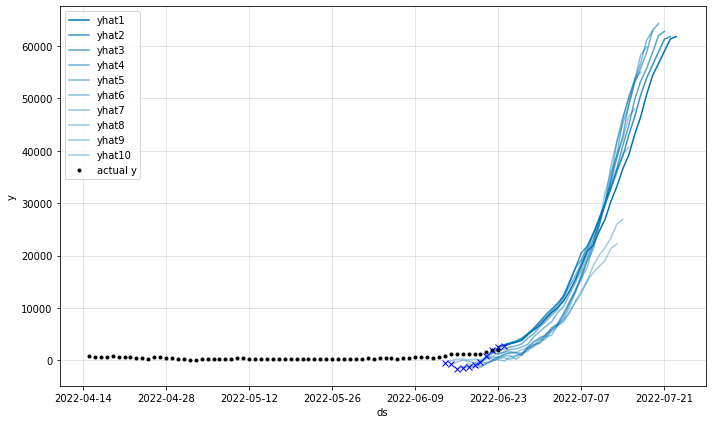

In [36]:
# predict out-sample datasets
future = m.make_future_dataframe(
    df=concat_df_event_neural_prophet,
    events_df=df_event_neural_prophet,
    n_historic_predictions=10
)
forecast_out_sample = m.predict(df=future)
fig = m.plot(forecast_out_sample)

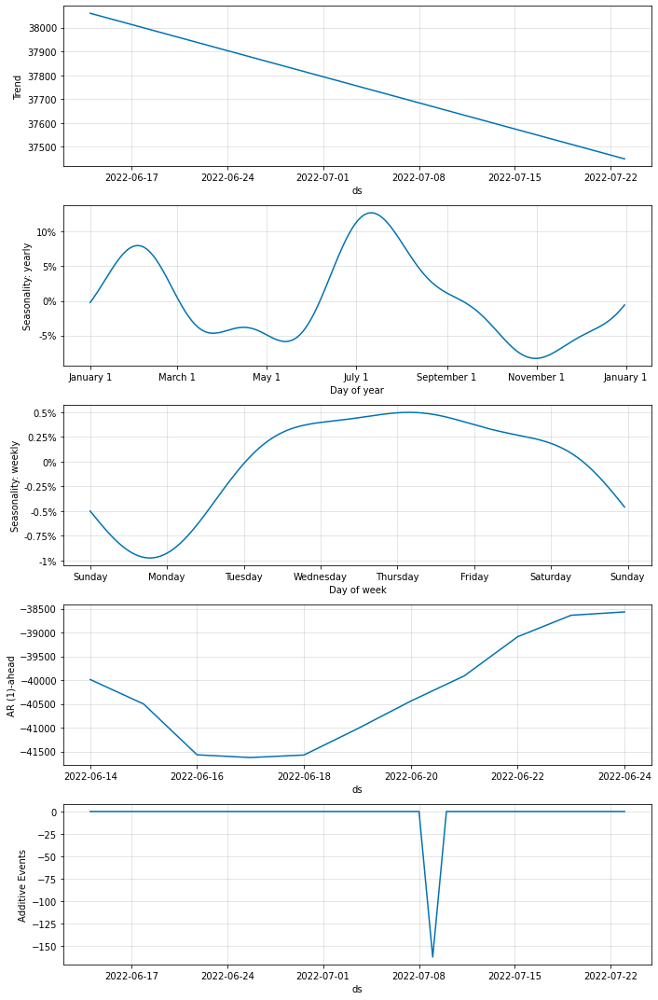

In [37]:
# plot component
fig = m.plot_components(forecast_out_sample)

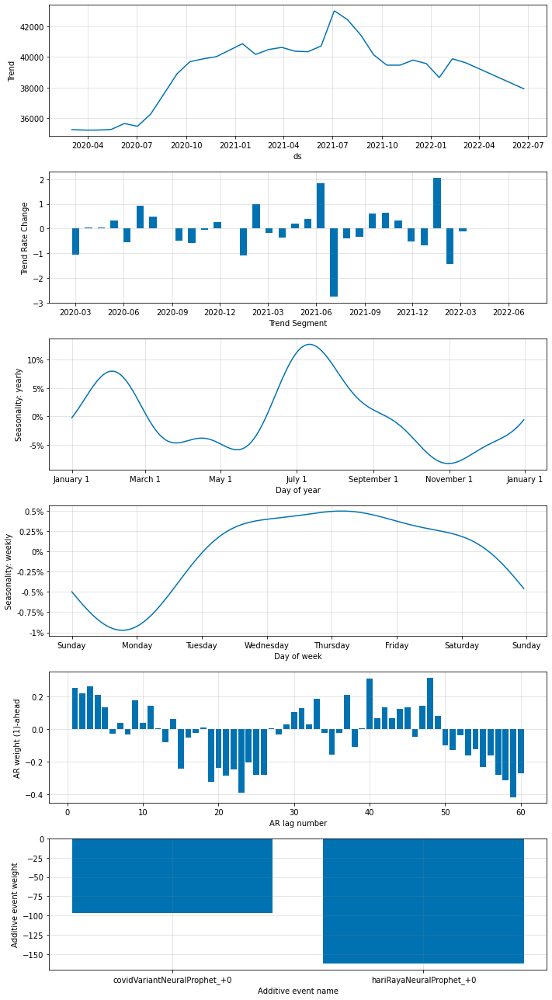

In [38]:
# plot all parameter
fig_param = m.plot_parameters()

## 4.2 Facebook Prophet

In [173]:
# set all param to model
m = Prophet(
    **params_facebook_prophet
)

# fit data train to model
m.fit(df)

INFO:cmdstanpy:Chain [1] start processing
INFO:cmdstanpy:Chain [1] done processing


In [250]:
# make future dataframe with test sets
future_out_sample = m.make_future_dataframe(
    periods=30, # use dataset test to predict future
    freq='D',
    # include_history=30,
)

future_out_sample.tail()

,ds
868,2022-07-19
869,2022-07-20
870,2022-07-21
871,2022-07-22
872,2022-07-23


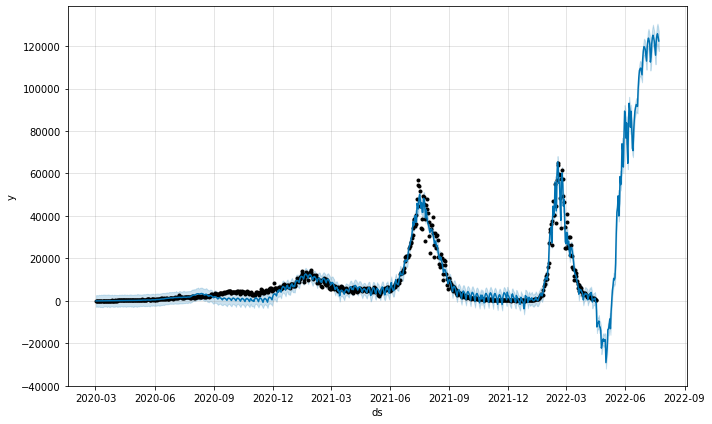

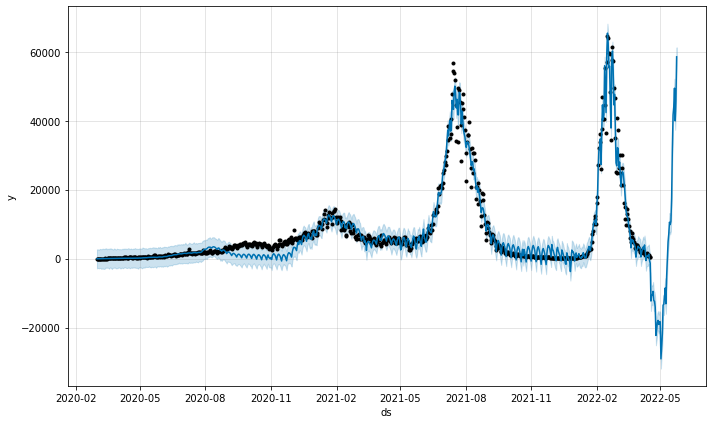

In [266]:
forecast_out_sample = m.predict(future_out_sample)
fig = m.plot(forecast_out_sample)
fig1 = m.plot(forecast_out_sample[:-60])

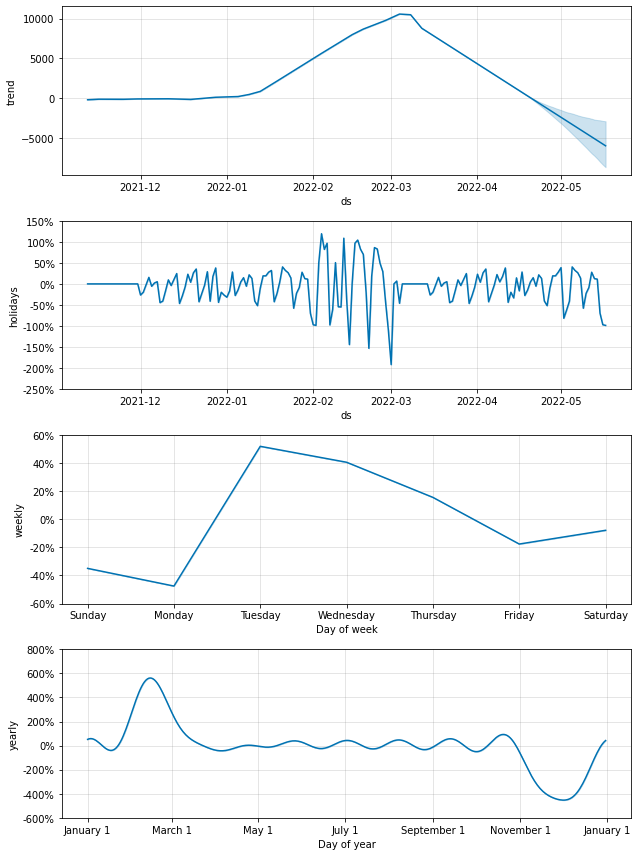

In [ ]:
# plot component
fig = m.plot_components(forecast_out_sample)

# 6. Save Model


In [102]:
import pickle

In [ ]:
# 821
with open('/content/model_7.pkl', "wb") as f:
   pickle.dump(m, f)

In [106]:
model = pickle.load(open('./model/model_7.pkl', 'rb'))

AttributeError: Can't get attribute 'MissingDataHandling' on <module 'neuralprophet.configure' from '/Users/efraimwijaya/Developer/github/skripsi-forecasting-neural-prophet/new-neural-prophet/neural_prophet/neuralprophet/configure.py'>

In [ ]:
print("DONE")

DONE


# 7. EDA

In [108]:
!pip install plotly

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.2/15.2 MB 2.9 MB/s eta 0:00:00m eta 0:00:010:00:01


In [ ]:
import pandas as pd

# data location
data_location = "./datasets/with23jul.xlsx"

# read data 
df = pd.read_excel(
    data_location,
    usecols=['Tanggal','Kasus harian'],
    dtype={
        'Kasus harian': 'int',
    },
    converters= {
        'Tanggal': pd.to_datetime
    }
)

# rename to ds, y 
df = pd.DataFrame(list(zip(df["Tanggal"], df["Kasus harian"])),
               columns =['ds', 'y'])



In [ ]:
df = df.set_index('ds')

In [109]:
import plotly.graph_objs as go

fig = go.Figure()
fig.add_trace(go.Scatter(x=df['ds'], y=df['y'], name='Actual',))
# fig.add_trace(go.Scatter(x=forecast_in_sample['ds'], y=forecast_in_sample['yhat1'], name='Predicted',))
# fig.add_trace(go.Scatter(x=forecast_in_sample['ds'], y=forecast_in_sample['event_covidVariantNeuralProphet'], name='Covid Variant',))
# fig.add_trace(go.Scatter(x=forecast_in_sample['ds'], y=forecast_in_sample['event_hariRayaNeuralProphet'], name='Hari Raya',))

fig.show()

# 8. Inference with new data

## 8.1 Neural Prophet

In [164]:
# data location
# data_location = "./datasets/statistik-harian-2022.xlsx"
data_location = "./datasets/with23jul.xlsx"

# read data 
df = pd.read_excel(
    data_location,
    usecols=['Tanggal','Kasus harian'],
    dtype={
        'Kasus harian': 'int',
    },
    converters= {
        'Tanggal': pd.to_datetime
    }
)

# rename to ds, y 
df = pd.DataFrame(list(zip(df["Tanggal"], df["Kasus harian"])),
               columns =['ds', 'y'])

In [165]:
# For Neural Prophet
covidVariantNeuralProphet = pd.DataFrame({ # COVID-19 variant
    'event': 'covidVariantNeuralProphet',
    'ds': pd.to_datetime([
        '2021-05-01', # Alpha, Beta, Delta
        '2021-12-01', # Omnicorn
        '2022-03-15', # Son of omnicorn
    ]),
    'lower_window': 0, # Before Event
    'upper_window': 30*3, # After Event
})

hariRayaNeuralProphet = pd.DataFrame({ # manual set hari raya as holidays
    'event': 'hariRayaNeuralProphet',
    'ds': pd.to_datetime([
        # 2020
        '2020-01-01', '2020-01-25', '2020-03-22',
        '2020-03-25', '2020-04-10', '2020-05-01',
        '2020-05-07', '2020-05-21', '2020-05-22',
        '2020-05-24', '2020-05-25', '2020-06-01',
        '2020-07-31', '2020-08-17', '2020-08-21',
        '2020-10-28', '2020-10-29', '2020-10-30',
        '2020-12-09', '2020-12-24', '2020-12-25',
        '2020-12-31',
        # 2021
        '2021-01-01', '2021-02-12', '2021-03-11',
        '2021-03-14', '2021-04-02', '2021-05-01',
        '2021-05-12', '2021-05-13', '2021-05-14',
        '2021-05-26', '2021-06-01', '2021-07-20', 
        '2021-08-11', '2021-08-17', '2021-10-20', 
        '2021-12-25', '2021-12-31',
        # 2022
        '2022-01-01', '2022-02-01', '2022-02-28',
        '2022-03-03', '2022-04-15', '2022-05-01',
        '2022-05-02', '2022-05-03', '2022-05-16',
        '2022-05-26', '2022-06-01', '2022-07-09', 
        '2022-07-30', '2022-08-17', '2022-10-08', 
        '2022-12-25', '2022-12-31',
        # 2023
        '2023-01-01', '2023-01-22', '2023-02-18',
        '2023-03-22', '2023-04-07', '2023-04-22',
        '2023-04-23', '2023-05-01', '2023-05-06',
        '2023-05-18', '2023-06-01', '2023-06-29',
        '2023-07-19', '2023-08-17', '2023-09-27',
        '2023-12-25',     

    ]),
    'lower_window': 0, # Before Event
    'upper_window': 1, # After Event
})

# merge data as one history event
df_event_neural_prophet = pd.concat((covidVariantNeuralProphet, hariRayaNeuralProphet))

# For Facebook Prophet
covidVariantFacebookProphet = pd.DataFrame({ # COVID-19 variant
    'holiday': 'covidVariantFacebookProphet',
    'ds': pd.to_datetime([
        '2021-05-01', # Alpha, Beta, Delta
        '2021-12-01', # Omnicorn
        '2022-03-15', # Son of omnicorn
    ]),
    'lower_window': 0,
    'upper_window': 30*3,
})

hariRayaFacebookProphet = pd.DataFrame({ # manual set hari raya as holidays
    'holiday': 'hariRayaFacebookProphet',
    'ds': pd.to_datetime([
        # 2020
        '2020-01-01', '2020-01-25', '2020-03-22',
        '2020-03-25', '2020-04-10', '2020-05-01',
        '2020-05-07', '2020-05-21', '2020-05-22',
        '2020-05-24', '2020-05-25', '2020-06-01',
        '2020-07-31', '2020-08-17', '2020-08-21',
        '2020-10-28', '2020-10-29', '2020-10-30',
        '2020-12-09', '2020-12-24', '2020-12-25',
        '2020-12-31',
        # 2021
        '2021-01-01', '2021-02-12', '2021-03-11',
        '2021-03-14', '2021-04-02', '2021-05-01',
        '2021-05-12', '2021-05-13', '2021-05-14',
        '2021-05-26', '2021-06-01', '2021-07-20', 
        '2021-08-11', '2021-08-17', '2021-10-20', 
        '2021-12-25', '2021-12-31',
        # 2022
        '2022-01-01', '2022-02-01', '2022-02-28',
        '2022-03-03', '2022-04-15', '2022-05-01',
        '2022-05-02', '2022-05-03', '2022-05-16',
        '2022-05-26', '2022-06-01', '2022-07-09', 
        '2022-07-30', '2022-08-17', '2022-10-08', 
        '2022-12-25', '2022-12-31',
        # 2023
        '2023-01-01', '2023-01-22', '2023-02-18',
        '2023-03-22', '2023-04-07', '2023-04-22',
        '2023-04-23', '2023-05-01', '2023-05-06',
        '2023-05-18', '2023-06-01', '2023-06-29',
        '2023-07-19', '2023-08-17', '2023-09-27',
        '2023-12-25',     

    ]),
    'lower_window': 0,
    'upper_window': 1,
})

df_event_facebook_prophet = pd.concat((covidVariantFacebookProphet, hariRayaFacebookProphet))

In [286]:
metrics = ['SmoothL1Loss', 'MAE', 'RMSE']

params_neural_prophet_nn = {
    # Data Preprocessing
    # 'normalize' : 'minmax',
    'impute_missing' : True,
    
    # Trend
    # 'growth' : 'off', 
    'n_changepoints' : 30,
    # 'changepoints_range' : 0.4, 
    # 'trend_reg' : 0,

    # Seasonality
    'yearly_seasonality' : True, 
    'weekly_seasonality' : True, 
    'daily_seasonality' : False, 
    'seasonality_mode' : 'multiplicative', 
    # 'seasonality_reg' : 0, # regularize seasonal

    # AR-Net (Classical AR)
    'n_lags' : 60,
    'n_forecasts' : 30,
    # 'ar_reg' : 0.3, # regularize ar

    # Neural Network + (Classical AR)
    'batch_size' : 20, 
    'epochs' : 500,
    'num_hidden_layers' : 4,
    'd_hidden' : 16, 
    'learning_rate' : 0.005, 
    'loss_func' : 'mae',
    # 'collect_metrics' : True,
}

In [287]:
# set model with params
m = NeuralProphet(
    **params_neural_prophet_nn
)

# add history event
m = m.add_events(["covidVariantNeuralProphet", "hariRayaNeuralProphet"])
concat_df_event_neural_prophet = m.create_df_with_events(df, df_event_neural_prophet)

In [ ]:
# # split size data concat_df_event_neural_prophet
# df_size = concat_df_event_neural_prophet['y'].size
# df_train_size = int(df_size*0.8)
# df_test_size = int(df_size*0.2)

# # set size of train datasets
# df_train_neural_prophet = concat_df_event_neural_prophet[:df_train_size]

# # as train datasets make it to string date
# date = df_train_neural_prophet['ds'].tail(1)
# date = date.to_string(index=False)
# # date

# # split data as data time
# df_train_neural_prophet = concat_df_event_neural_prophet[df['ds'] < pd.Timestamp(date)]
# df_test_neural_prophet = concat_df_event_neural_prophet[df['ds'] >= pd.Timestamp(date)]

# df_train_neural_prophet.tail()

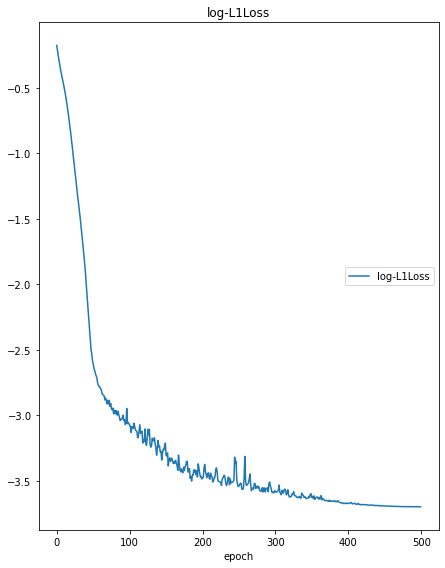

log-L1Loss
	log-L1Loss       	 (min:   -3.697, max:   -0.176, cur:   -3.697)


In [288]:
# # train data
metrics_neural_prophet = m.fit(
    df=concat_df_event_neural_prophet, 
    freq='D', 
    # validation_df=df_test_neural_prophet, 
    progress='plot',
)

In [285]:
metrics_neural_prophet.describe().loc[["mean", "std", "min", "max"]]

,L1Loss,MAE,RMSE,RegLoss
mean,0.222696,7987.424318,11368.515097,0.0
std,0.456934,16388.866562,19542.773286,0.0
min,0.032706,1173.059122,2625.203398,0.0
max,1.882773,67529.414528,79831.081643,0.0


In [227]:
metrics_neural_prophet.describe().loc[["mean", "std", "min", "max"]]

,L1Loss,MAE,RMSE,RegLoss
mean,0.079043,2835.024103,4686.296037,0.002808
std,0.153788,5515.916874,7166.690418,0.003272
min,0.026363,945.550471,2133.580912,0.000000
max,0.729943,26180.860694,34225.601252,0.007970


INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.763% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
WARNING - (py.warnings._showwarnmsg) - /Users/efraimwijaya/Developer/github/skripsi-forecasting-neural-prophet/new-neural-prophet/neural_prophet/neuralprophet/forecaster.py:1665: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.771% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.771% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.forecaster.__handle_missing_data) - 1 missing dates added.
INFO - (NP.forecaster.__handle_missing_data) - 1 NaN values in 

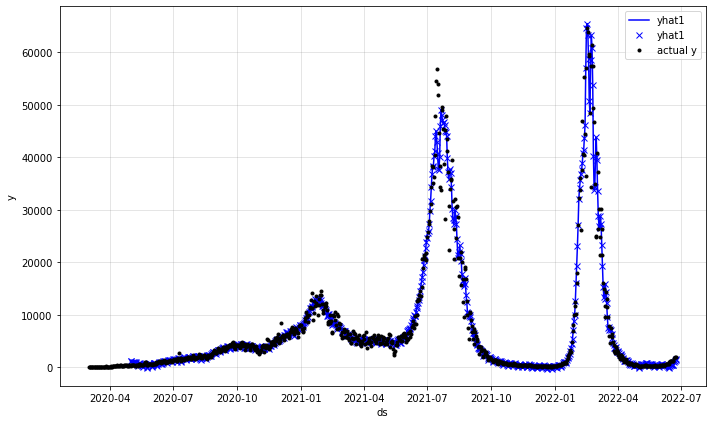

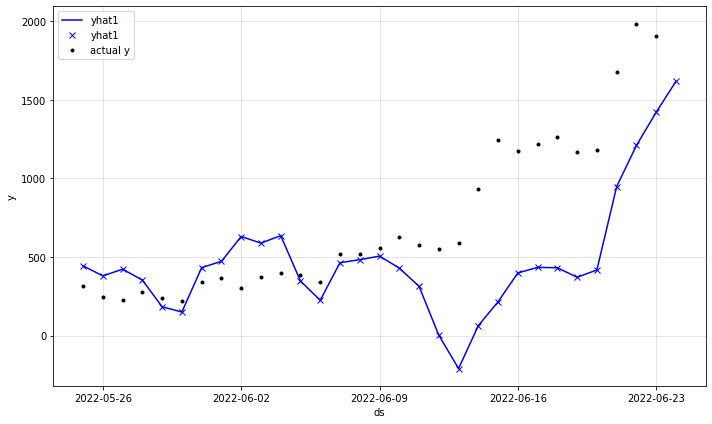

In [280]:
# forecast test data
future = m.make_future_dataframe(
    df=concat_df_event_neural_prophet, 
    events_df=df_event_neural_prophet, 
    n_historic_predictions=True,
)
forecast_in_sample = m.predict(future)

m = m.highlight_nth_step_ahead_of_each_forecast(1)

fig = m.plot(forecast_in_sample)
fig1 = m.plot(forecast_in_sample[-60:])


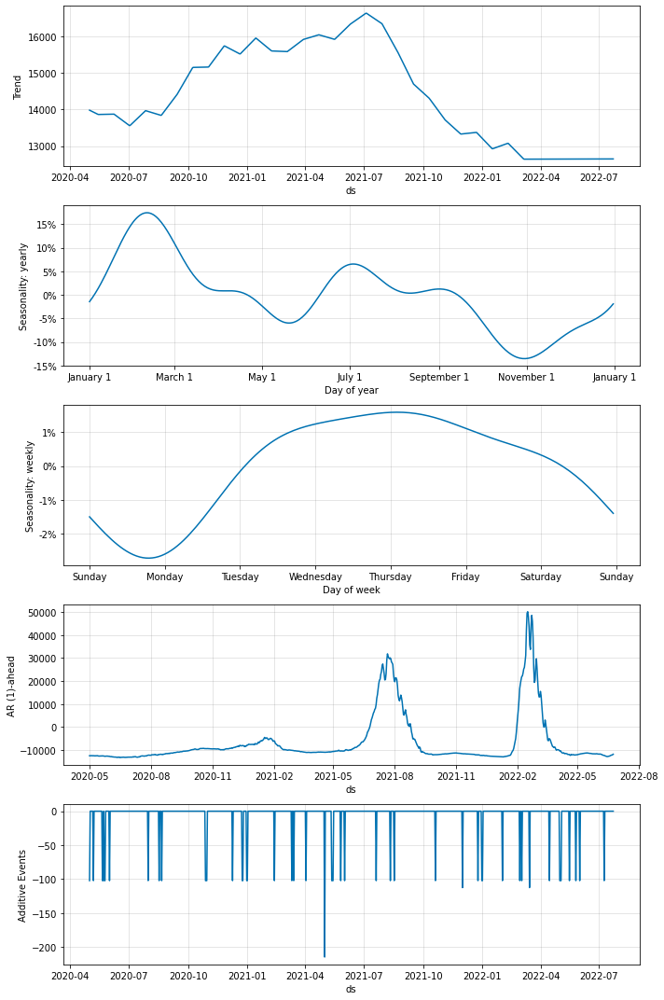

In [281]:
# plot component
fig = m.plot_components(forecast_in_sample)

In [271]:
actuals = concat_df_event_neural_prophet['y']
predictions = forecast_in_sample['yhat1'][:-31].fillna(0)

In [272]:
print(actuals.to_markdown())

|     |     y |
|----:|------:|
|   0 |     2 |
|   1 |     0 |
|   2 |     0 |
|   3 |     0 |
|   4 |     2 |
|   5 |     0 |
|   6 |     2 |
|   7 |    13 |
|   8 |     8 |
|   9 |     0 |
|  10 |    35 |
|  11 |    27 |
|  12 |    21 |
|  13 |    17 |
|  14 |    38 |
|  15 |    55 |
|  16 |    82 |
|  17 |    60 |
|  18 |    81 |
|  19 |    64 |
|  20 |    65 |
|  21 |   106 |
|  22 |   105 |
|  23 |   103 |
|  24 |   153 |
|  25 |   109 |
|  26 |   130 |
|  27 |   129 |
|  28 |   114 |
|  29 |   149 |
|  30 |   113 |
|  31 |   196 |
|  32 |   106 |
|  33 |   181 |
|  34 |   218 |
|  35 |   247 |
|  36 |   218 |
|  37 |   337 |
|  38 |   219 |
|  39 |   330 |
|  40 |   399 |
|  41 |   316 |
|  42 |   282 |
|  43 |   297 |
|  44 |   380 |
|  45 |   407 |
|  46 |   325 |
|  47 |   327 |
|  48 |   185 |
|  49 |   375 |
|  50 |   283 |
|  51 |   357 |
|  52 |   436 |
|  53 |   396 |
|  54 |   275 |
|  55 |   214 |
|  56 |   415 |
|  57 |   260 |
|  58 |   347 |
|  59 |   433 |
|  60 | 

In [273]:
print(predictions.to_markdown())

|     |      yhat1 |
|----:|-----------:|
|   0 |     0      |
|   1 |     0      |
|   2 |     0      |
|   3 |     0      |
|   4 |     0      |
|   5 |     0      |
|   6 |     0      |
|   7 |     0      |
|   8 |     0      |
|   9 |     0      |
|  10 |     0      |
|  11 |     0      |
|  12 |     0      |
|  13 |     0      |
|  14 |     0      |
|  15 |     0      |
|  16 |     0      |
|  17 |     0      |
|  18 |     0      |
|  19 |     0      |
|  20 |     0      |
|  21 |     0      |
|  22 |     0      |
|  23 |     0      |
|  24 |     0      |
|  25 |     0      |
|  26 |     0      |
|  27 |     0      |
|  28 |     0      |
|  29 |     0      |
|  30 |     0      |
|  31 |     0      |
|  32 |     0      |
|  33 |     0      |
|  34 |     0      |
|  35 |     0      |
|  36 |     0      |
|  37 |     0      |
|  38 |     0      |
|  39 |     0      |
|  40 |     0      |
|  41 |     0      |
|  42 |     0      |
|  43 |     0      |
|  44 |     0      |
|  45 |     0

In [274]:
import plotly.graph_objs as go

fig = go.Figure()
fig.add_trace(go.Scatter(x=concat_df_event_neural_prophet['ds'], y=concat_df_event_neural_prophet['y'], name='Actual',))
fig.add_trace(go.Scatter(x=forecast_in_sample['ds'], y=forecast_in_sample['yhat1'], name='Predicted',))
# fig.add_trace(go.Scatter(x=forecast_in_sample['ds'], y=forecast_in_sample['event_covidVariantNeuralProphet'], name='Covid Variant',))
# fig.add_trace(go.Scatter(x=forecast_in_sample['ds'], y=forecast_in_sample['event_hariRayaNeuralProphet'], name='Hari Raya',))

fig.show()

In [275]:
# Neural Prophet
from statsmodels.tools.eval_measures import rmse, meanabs, mse

print(f"RMSE: {(rmse(actuals, predictions))}")
# print(f"MSE: {(mse(actuals, predictions))}")
print(f"MAE: {(meanabs(actuals, predictions))}")
# print(f"MAPE: {(np.round(np.mean(np.abs(100*actuals/predictions)), 0))} %")

RMSE: 2543.3454205587504
MAE: 1160.6610609350962


INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.763% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
WARNING - (py.warnings._showwarnmsg) - /Users/efraimwijaya/Developer/github/skripsi-forecasting-neural-prophet/new-neural-prophet/neural_prophet/neuralprophet/forecaster.py:1665: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.0% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.0% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
WARNING - (py.warnings._showwarnmsg) - /Users/efraimwijaya/Developer/github/skripsi-forecasting-neural-prophet/new-neural-prophet/neural_

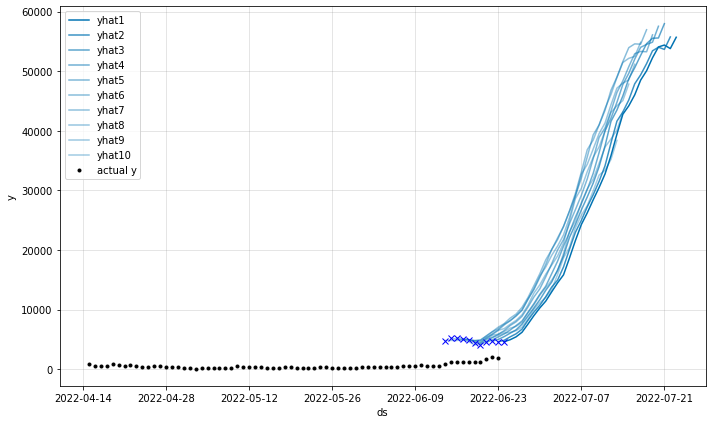

In [248]:
# predict out-sample datasets
future = m.make_future_dataframe(
    df=concat_df_event_neural_prophet,
    events_df=df_event_neural_prophet,
    n_historic_predictions=10
)
forecast_out_sample = m.predict(df=future)
fig = m.plot(forecast_out_sample)

## 8.2 Facebook Prophet

In [174]:
params_facebook_prophet = {
    # trend
    'n_changepoints' : 30, 
    'changepoint_prior_scale' : 0.5,

    # seasonality
    'yearly_seasonality' : True,
    'weekly_seasonality' : True,
    'daily_seasonality' : False,
    'seasonality_mode' : 'multiplicative', 
    
    # event
    'holidays' : df_event_facebook_prophet,
    'holidays_prior_scale' : 0.05,

}

In [175]:
# set all param to model
m = Prophet(
    **params_facebook_prophet
)

# fit data train to model
m.fit(df)

INFO:cmdstanpy:Chain [1] start processing
INFO:cmdstanpy:Chain [1] done processing


In [176]:
future = m.make_future_dataframe(
    periods=30,
    freq='D',
    # include_history=False,
)

future.tail()

,ds
868,2022-07-19
869,2022-07-20
870,2022-07-21
871,2022-07-22
872,2022-07-23


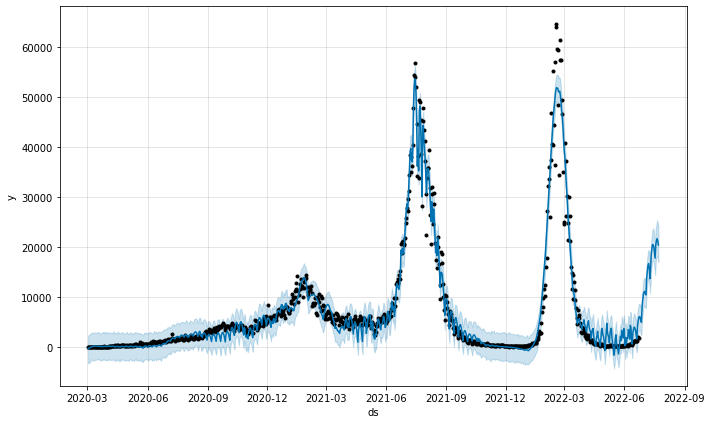

In [177]:
forecast_in_sample = m.predict(future)
fig = m.plot(forecast_in_sample)

In [ ]:
fig = m.plot(forecast_in_sample[:60])

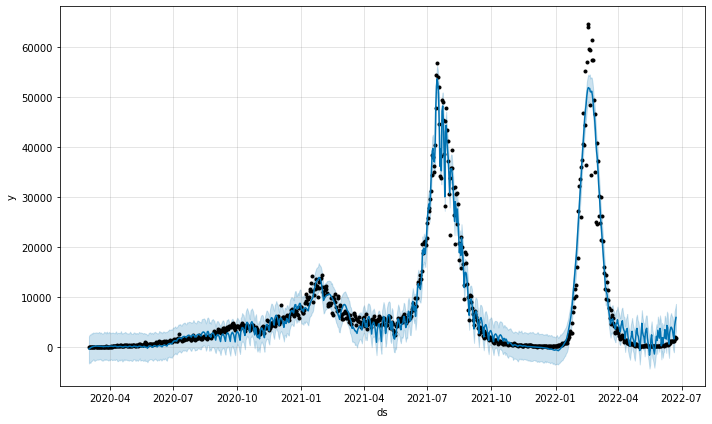

In [178]:
fig = m.plot(forecast_in_sample[:-30])

In [179]:
forecast_in_sample.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,covidVariantFacebookProphet,covidVariantFacebookProphet_lower,covidVariantFacebookProphet_upper,hariRayaFacebookProphet,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat
868,2022-07-19,33966.091805,17275.536415,24062.245212,31513.588358,36690.934832,0.0,0.0,0.0,0.0,...,0.005707,0.005707,0.005707,-0.402165,-0.402165,-0.402165,0.0,0.0,0.0,20499.968308
869,2022-07-20,34144.756215,17818.705100,24494.871867,31457.548036,37025.831395,0.0,0.0,0.0,0.0,...,0.027279,0.027279,0.027279,-0.403888,-0.403888,-0.403888,0.0,0.0,0.0,21285.519976
870,2022-07-21,34323.420625,18254.323915,25476.370797,31448.367452,37414.921498,0.0,0.0,0.0,0.0,...,0.039355,0.039355,0.039355,-0.406920,-0.406920,-0.406920,0.0,0.0,0.0,21707.360160
871,2022-07-22,34502.085035,17925.603478,24889.764323,31455.099182,37825.247480,0.0,0.0,0.0,0.0,...,0.027989,0.027989,0.027989,-0.411069,-0.411069,-0.411069,0.0,0.0,0.0,21285.009789
872,2022-07-23,34680.749445,17055.606953,24173.664541,31423.119037,38280.731575,0.0,0.0,0.0,0.0,...,0.005978,0.005978,0.005978,-0.416142,-0.416142,-0.416142,0.0,0.0,0.0,20455.945222


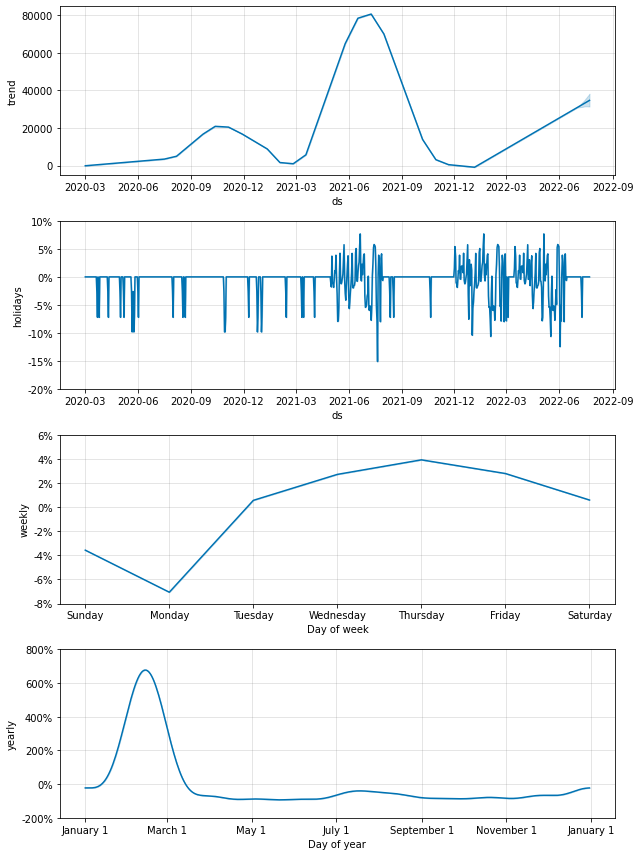

In [180]:
# plot component
fig = m.plot_components(forecast_in_sample)

In [181]:
actuals = df['y']
predictions = forecast_in_sample['yhat'][:-30]

In [182]:
print(actuals.to_markdown())
print(predictions.to_markdown())

|     |     y |
|----:|------:|
|   0 |     2 |
|   1 |     0 |
|   2 |     0 |
|   3 |     0 |
|   4 |     2 |
|   5 |     0 |
|   6 |     2 |
|   7 |    13 |
|   8 |     8 |
|   9 |     0 |
|  10 |    35 |
|  11 |    27 |
|  12 |    21 |
|  13 |    17 |
|  14 |    38 |
|  15 |    55 |
|  16 |    82 |
|  17 |    60 |
|  18 |    81 |
|  19 |    64 |
|  20 |    65 |
|  21 |   106 |
|  22 |   105 |
|  23 |   103 |
|  24 |   153 |
|  25 |   109 |
|  26 |   130 |
|  27 |   129 |
|  28 |   114 |
|  29 |   149 |
|  30 |   113 |
|  31 |   196 |
|  32 |   106 |
|  33 |   181 |
|  34 |   218 |
|  35 |   247 |
|  36 |   218 |
|  37 |   337 |
|  38 |   219 |
|  39 |   330 |
|  40 |   399 |
|  41 |   316 |
|  42 |   282 |
|  43 |   297 |
|  44 |   380 |
|  45 |   407 |
|  46 |   325 |
|  47 |   327 |
|  48 |   185 |
|  49 |   375 |
|  50 |   283 |
|  51 |   357 |
|  52 |   436 |
|  53 |   396 |
|  54 |   275 |
|  55 |   214 |
|  56 |   415 |
|  57 |   260 |
|  58 |   347 |
|  59 |   433 |
|  60 | 

In [183]:
import plotly.graph_objs as go

fig = go.Figure()
fig.add_trace(go.Scatter(x=df['ds'], y=df['y'], name='Actual',))
fig.add_trace(go.Scatter(x=forecast_in_sample['ds'], y=forecast_in_sample['yhat'], name='Predicted',))
# fig.add_trace(go.Scatter(x=forecast_in_sample['ds'], y=forecast_in_sample['trend'], name='Trend',))
# fig.add_trace(go.Scatter(x=forecast_in_sample['ds'], y=forecast_in_sample['covidVariantFacebookProphet'], name='Covid Variant',))
# fig.add_trace(go.Scatter(x=forecast_in_sample['ds'], y=forecast_in_sample['hariRayaFacebookProphet'], name='Hari Raya',))
fig.show()

In [184]:
from statsmodels.tools.eval_measures import rmse, meanabs, mse

print(f"RMSE: {(rmse(actuals, predictions))}")
# print(f"MSE: {(mse(actuals, predictions))}")
print(f"MAE: {(meanabs(actuals, predictions))}")
# print(f"MAPE: {(np.round(np.mean(np.abs((actuals - predictions) / actuals)) * 100))} %")
# print(f"MAPE: {(np.round(np.mean(np.abs(100*actuals/predictions)), 0))} %")


RMSE: 2122.165593855983
MAE: 1239.6785620259614
